In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import nxviz as nv
import matplotlib.pyplot as plt 
import ast
import json
import os

/opt/anaconda3/lib/python3.8/site-packages/nxviz/__init__.py:18: UserWarning: 
nxviz has a new API! Version 0.7.4 onwards, the old class-based API is being
deprecated in favour of a new API focused on advancing a grammar of network
graphics. If your plotting code depends on the old API, please consider
pinning nxviz at version 0.7.4, as the new API will break your old code.

To check out the new API, please head over to the docs at
https://ericmjl.github.io/nxviz/ to learn more. We hope you enjoy using it!

(This deprecation message will go away in version 1.0.)

  warnings.warn(


# Q1 Analyis of collab network (All)

In [2]:
collab_network = pd.read_csv('./output/collab_network_csv.csv', index_col='Unnamed: 0')

In [3]:
collab_network['coauthors_list'] = collab_network['coauthors_list'].apply(lambda x: ast.literal_eval(x))

In [4]:
G = nx.Graph()
G.add_nodes_from(collab_network['author_pid'])

In [5]:
for i in range(0, len(collab_network)):
    
    author = collab_network.iloc[i]['author_pid']
    coauthors = collab_network.iloc[i]['coauthors_list']
    
    for coauthor in coauthors:
        if coauthor in G.nodes():
            G.add_edge(author, coauthor)

In [6]:
newpath = f'./Results/'
if not os.path.exists(newpath):
    os.makedirs(newpath)

# Graph visualisation

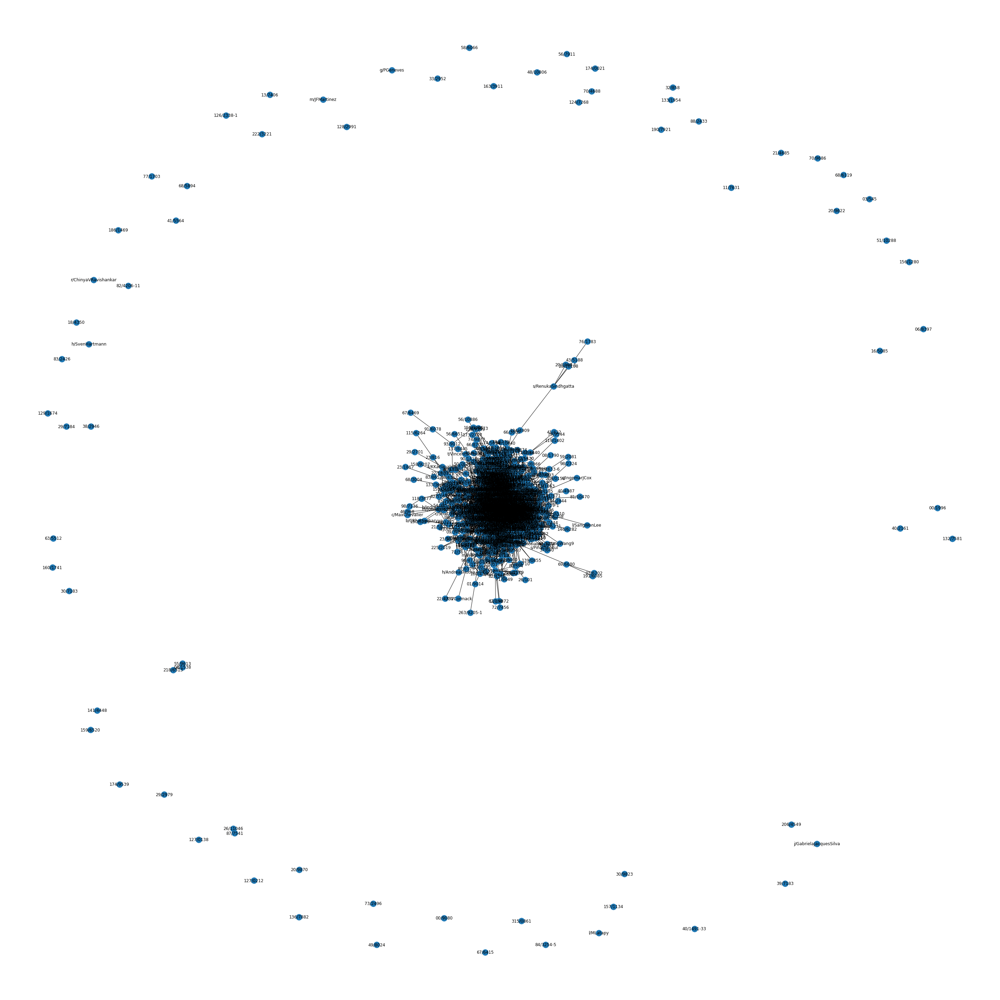

In [7]:
plt.figure(figsize=(40, 40))
nx.draw(G, with_labels=True)
plt.savefig('./Results/q1_graph_visualisation.png')

# Degree Centrality and Distribution

In [8]:
# Compute the degree distribution
degrees = [len(list(G.neighbors(n))) for n in G.nodes()]

In [9]:
# Compute the degree centrality
deg_cent = nx.degree_centrality(G)

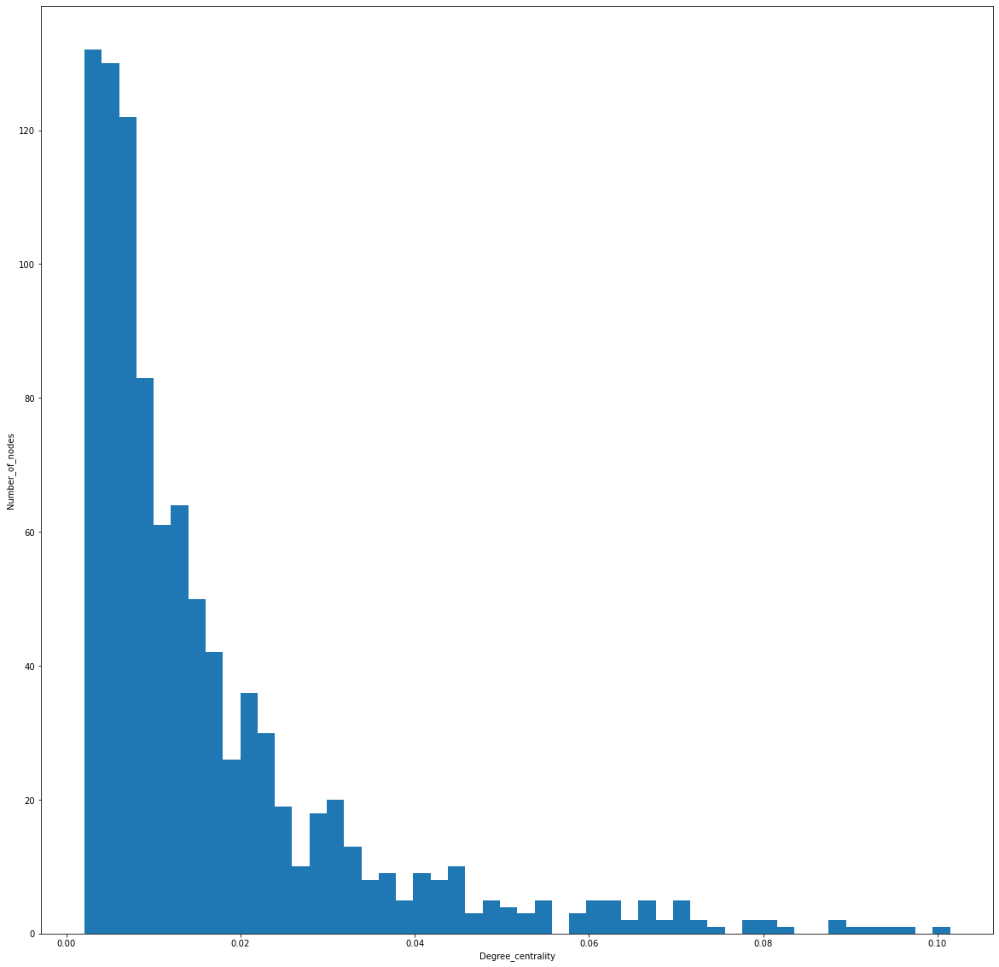

In [10]:
# Plot histogram of the degree centrality distribution of the graph
plt.figure(figsize=(20, 20))
plt.xlabel('Degree_centrality')
plt.ylabel('Number_of_nodes')
plt.hist(list(deg_cent.values()), bins=50)
plt.savefig('./Results/q1_deg_cent.png')

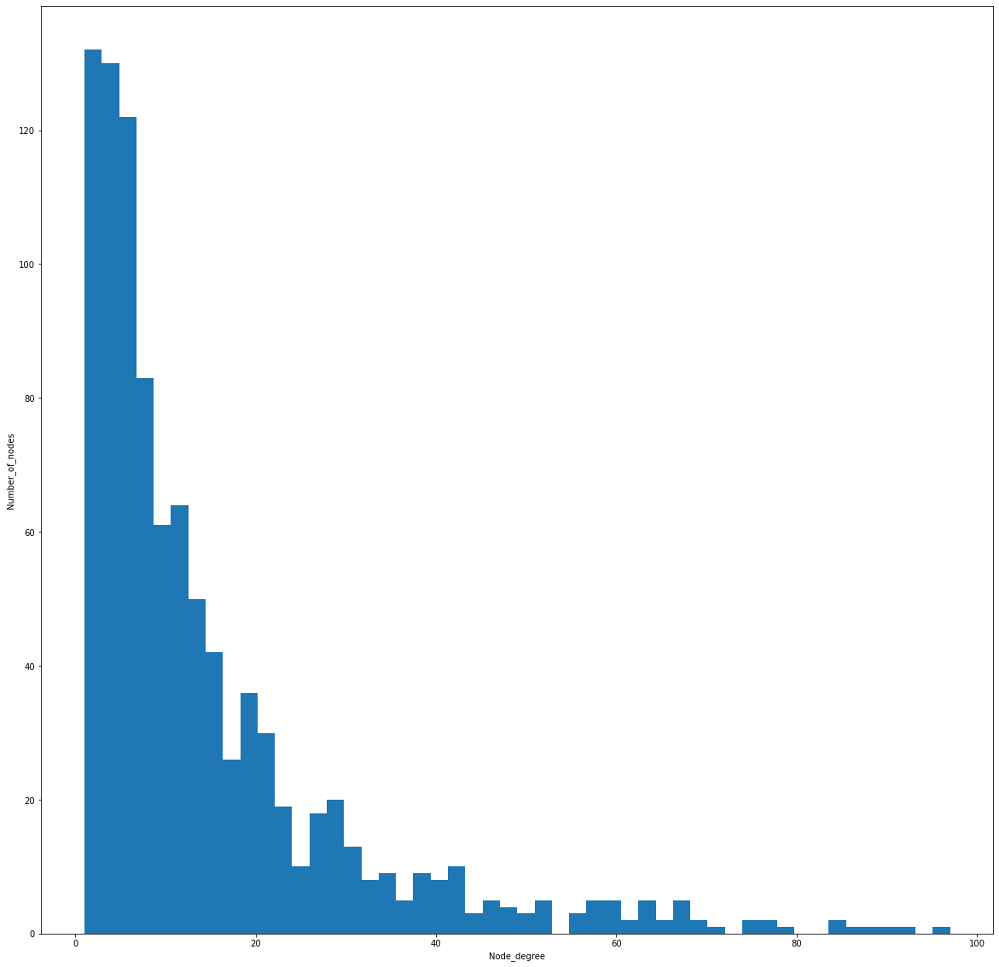

In [11]:
# Plot a histogram of the degree distribution of the graph
plt.figure(figsize=(20, 20))
plt.xlabel('Node_degree')
plt.ylabel('Number_of_nodes')
plt.hist(degrees, bins=50)
plt.savefig('./Results/q1_deg_dist.png')

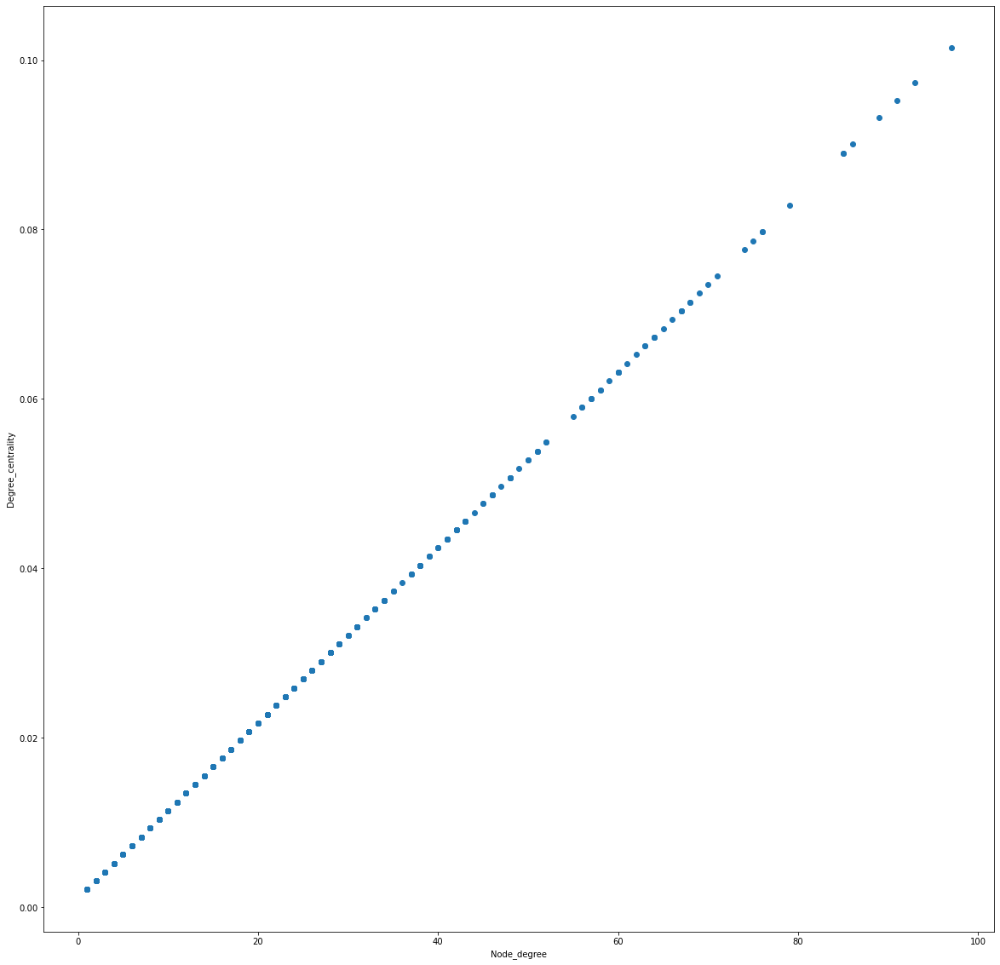

In [12]:
# Plot a scatter plot of the centrality distribution and the degree distribution
plt.figure(figsize=(20, 20))
plt.xlabel('Node_degree')
plt.ylabel('Degree_centrality')
plt.scatter(degrees, list(deg_cent.values()))
plt.savefig('./Results/q1_cent_and_deg_corr.png')

# Betweenness Centrality

In [13]:
bet_cent = nx.betweenness_centrality(G)

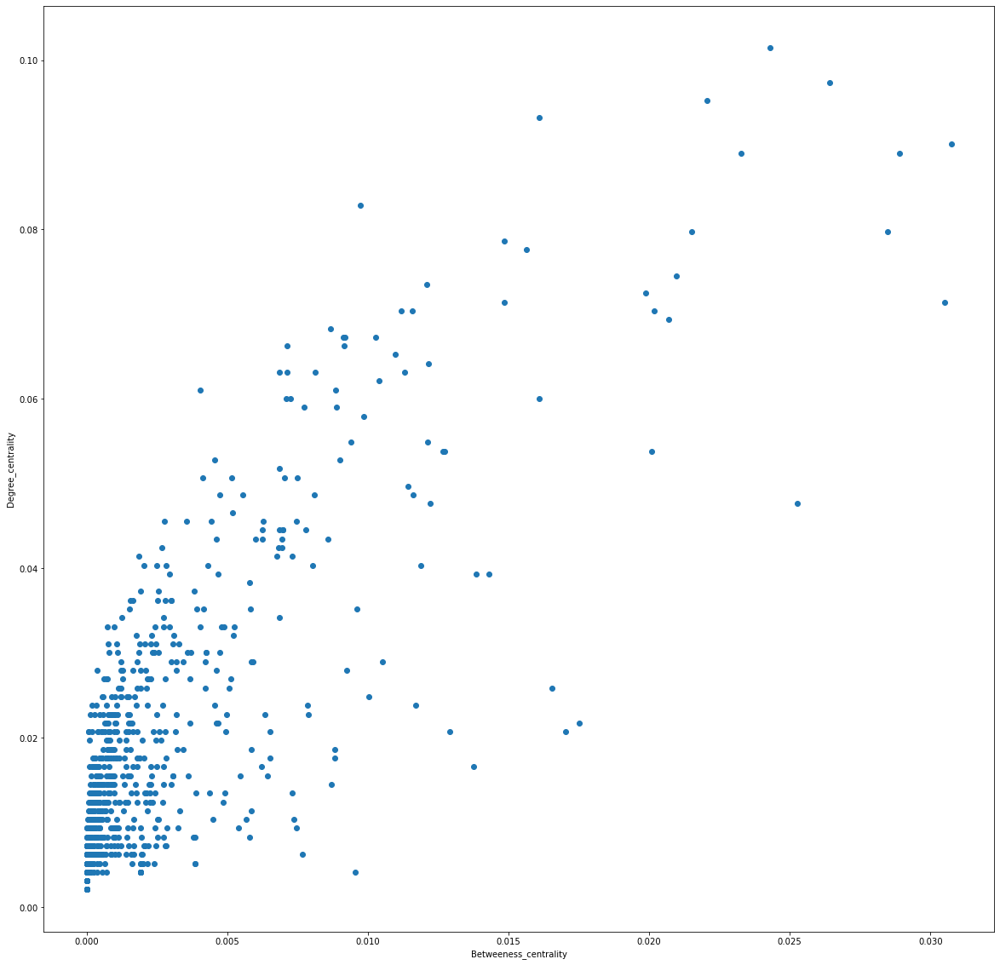

In [14]:
# Plot a scatter plot of the betweeness centrality and the degree centrality
plt.figure(figsize=(20, 20))
plt.scatter(list(bet_cent.values()), list(deg_cent.values()))
plt.xlabel('Betweeness_centrality')
plt.ylabel('Degree_centrality')
plt.savefig('./Results/q1_bet_and_deg_cent.png')

# Find the node with the highest Degree Centrality

In [15]:
def find_nodes_with_highest_deg_cent(graph):

    # Compute the degree centrality of G: deg_cent
    deg_cent = nx.degree_centrality(graph)

    # Compute the maximum degree centrality: max_dc
    max_dc = max(list(deg_cent.values()))

    nodes = set()

    # Iterate over the degree centrality dictionary
    for k, v in deg_cent.items():

        # Check if the current value has the maximum degree centrality
        if v == max_dc:

            # Add the current node to the set of nodes
            nodes.add(k)

    return nodes, max_dc

# Find the node(s) that has the highest degree centrality in T: top_dc
top_dc_node, top_dc_value = find_nodes_with_highest_deg_cent(G)

print(f'Author with highest degree centrality at {top_dc_value}: ', top_dc_node)

for node in top_dc_node:
    assert nx.degree_centrality(G)[node] == max(nx.degree_centrality(G).values())

Author with highest degree centrality at 0.10144927536231885:  {'o/BengChinOoi'}


# Find the node with the highest Betweeness Centrality

In [16]:
# Define find_node_with_highest_bet_cent()
def find_node_with_highest_bet_cent(graph):

    # Compute betweenness centrality: bet_cent
    bet_cent = nx.betweenness_centrality(graph)

    # Compute maximum betweenness centrality: max_bc
    max_bc = max(list(bet_cent.values()))

    nodes = set()

    # Iterate over the betweenness centrality dictionary
    for k, v in bet_cent.items():

        # Check if the current value has the maximum betweenness centrality
        if v == max_bc:

            # Add the current node to the set of nodes
            nodes.add(k)

    return nodes, max_bc

# Use that function to find the node(s) that has the highest betweenness centrality in the network: top_bc
top_bc_node, top_bc_value = find_node_with_highest_bet_cent(G)
print(f'Author with highest betweeness centrality at {top_bc_value}: ', top_bc_node)

for node in top_bc_node:
    assert nx.betweenness_centrality(G)[node] == max(nx.betweenness_centrality(G).values())

Author with highest betweeness centrality at 0.030742488465731663:  {'s/DiveshSrivastava'}


# Find the node with the highest Closeness Centrality


In [17]:
def find_node_with_highest_close_cent(graph):

    # Compute betweenness centrality: bet_cent
    close_cent = nx.closeness_centrality(graph)

    # Compute maximum betweenness centrality: max_bc
    max_cc = max(list(close_cent.values()))

    nodes = set()

    # Iterate over the betweenness centrality dictionary
    for k, v in close_cent.items():

        # Check if the current value has the maximum betweenness centrality
        if v == max_cc:

            # Add the current node to the set of nodes
            nodes.add(k)

    return nodes, max_cc

top_cc_node, top_cc_value = find_node_with_highest_close_cent(G)
print(f'Author with highest closeness centrality at {top_cc_value}: ', top_cc_node)

Author with highest closeness centrality at 0.40596980354628515:  {'o/BengChinOoi'}


# Find the maximal clique

In [18]:
def maximal_cliques(graph):
    mcs = []
    giant_component_size = max([len(i) for i in nx.find_cliques(G)])
    
    for clique in nx.find_cliques(graph):
        if len(clique) == giant_component_size:
            mcs.append(clique)
            
    return giant_component_size, mcs
    

giant_size, giant_cliques = maximal_cliques(G)


print('Size of giant component: ', giant_size) 
print('Cliques of this size: ', giant_cliques)

Size of giant component:  25
Cliques of this size:  [['o/BengChinOoi', '16/4915', 'a/DJAbadi', 'b/MagdalenaBalazinska', 's/DanSuciu', 'h/AlonYHalevy', 'c/SurajitChaudhuri', '58/4127', 's/MichaelStonebraker', 'a/AnastassiaAilamaki', 'f/MJFranklin', 'd/AnHaiDoan', 'm/VMarkl', 'm/TovaMilo', '26/6037', 'r/ChristopherRe', 'b/PhilipABernstein', 'k/DonaldKossmann', 'i/StratosIdreos', '91/275', '47/8816', 'b/PeterABoncz', 'f/JulianaFreire', 'o/FatmaOzcan', 'd/XinLunaDong']]


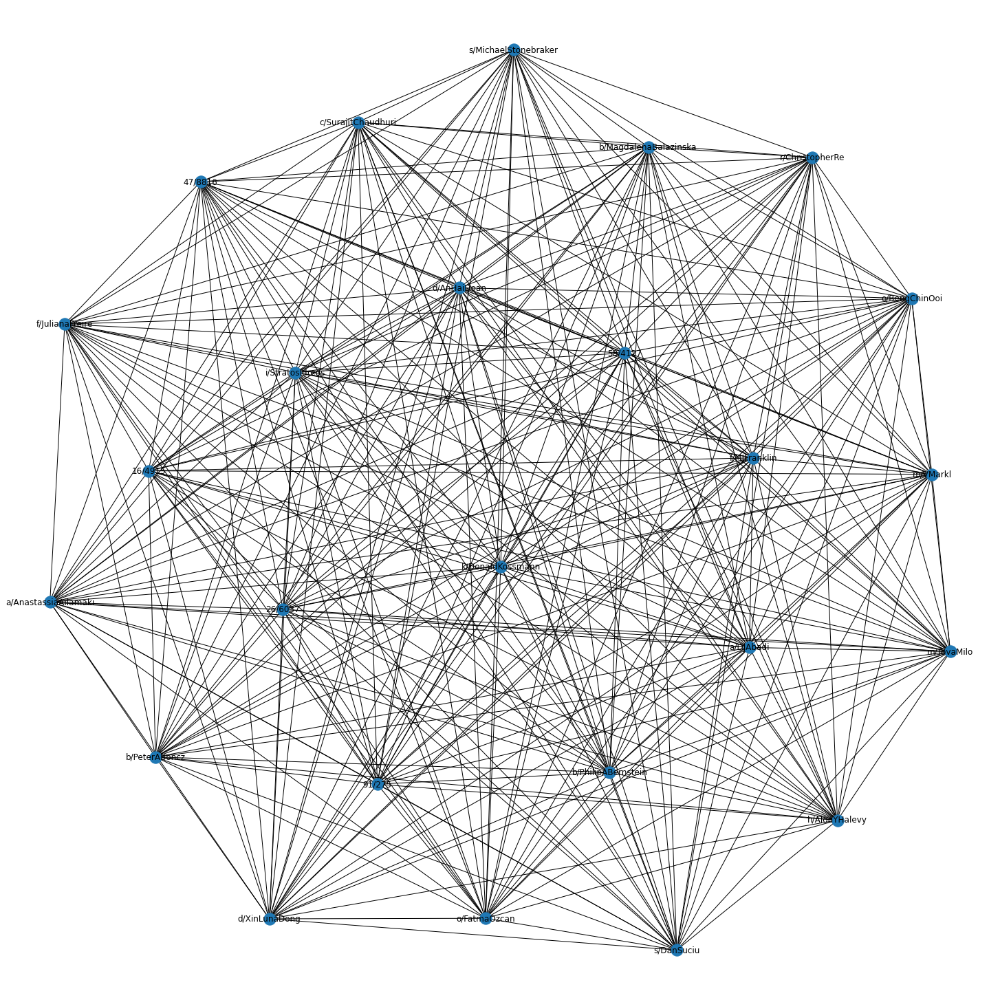

In [19]:
#Draw the subgraphs
i=0
for clique in giant_cliques:
    plt.figure(figsize=(20, 20))
    nx.draw(G.subgraph(giant_cliques[0]), with_labels=True)
    plt.savefig(f'./Results/q1_giant_clique_{i}.png')
    i+=1

# Find the giant component

In [20]:
Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
G0 = G.subgraph(Gcc[0])
plt.figure(figsize=(100, 100))
nx.draw(G.subgraph(G0), with_labels=True)
plt.savefig(f'./Results/q1_giant_component_{0}.png')

# Statistics

In [21]:
statistics = {
    
    'number of nodes' : len(G.nodes()),
    'number of edges' : len(G.edges()),
    'average_node_degree' : (2*len(G.edges()))/len(G.nodes()),
    'max_node_degree' : [list(G)[np.argmax(degrees)], max(degrees)],
    'degree_assortativity' : nx.degree_assortativity_coefficient(G),
    'average_clustering_coeff' : nx.average_clustering(G),
    'giant_clique_size' : giant_size,
    'giant_component_size' : len(G0),
    'giant_component_clustering_coeff' : nx.average_clustering(G0),
    'graph_density' : nx.density(G),
    'node_highest_degree_centrality' : [top_dc_node, top_dc_value],
    'node_highest_betweeness_centrality' : [top_bc_node, top_bc_value],
    'node_highest_closeness_centrality' : [top_cc_node, top_cc_value],

}

with open('./Results/q1_statistics.txt', 'w') as f:
    print(statistics, file=f)
    
plt.clf()

<Figure size 432x288 with 0 Axes>

# Q2 analysis of collab network (Yearly granularity)

In [22]:
yearly_collab_network = pd.read_csv('./output/year_granularity_df.csv', index_col='Unnamed: 0')

(23, 976)

In [23]:
def literal_eval_special(x):
    try:
        return ast.literal_eval(x)
    
    except:
        return None

In [25]:
yearly_stats_dict = {}
valid_authors = list(yearly_collab_network.columns)

for i in range(0, len(yearly_collab_network)):
    
    #get the publishing list per author for the year
    
    year = yearly_collab_network.iloc[i].name
    collab_network = pd.DataFrame(yearly_collab_network.iloc[i]).reset_index(names = ['author_pid']).rename({year: 'coauthors_list'}, axis='columns')

    collab_network['coauthors_list'] = collab_network['coauthors_list'].apply(lambda x: literal_eval_special(x))
    collab_network = collab_network[collab_network['coauthors_list'].notnull()].reset_index() #drop non-publishers
    
    newpath = f'./Results/{year}' 
    if not os.path.exists(newpath):
        os.makedirs(newpath)
    
    #load graph
    
    G = nx.Graph()
    for j in range(0, len(collab_network)):
    
        author = collab_network.iloc[j]['author_pid']
        coauthors = collab_network.iloc[j]['coauthors_list'][0]
        G.add_node(author)
    
        for coauthor in coauthors:
            if coauthor in valid_authors:
                if coauthor not in G.nodes():
                    G.add_node(coauthor)
            
                G.add_edge(author, coauthor)
    
    
    #run the bunch of analysis
    
    #graph visualisation
    plt.figure(figsize=(40, 40))
    nx.draw(G, with_labels=True)
    plt.savefig(f'./Results/{year}/q2_{year}_graph_visualisation.png') 
    
    #degree centrality
    degrees = [len(list(G.neighbors(n))) for n in G.nodes()]
    deg_cent = nx.degree_centrality(G)
    
    plt.figure(figsize=(20, 20))
    plt.xlabel('Degree_centrality')
    plt.ylabel('Number_of_nodes')
    plt.hist(list(deg_cent.values()), bins=50)
    plt.savefig(f'./Results/{year}/q2_{year}_deg_cent.png')
    
    #node degree
    plt.figure(figsize=(20, 20))
    plt.xlabel('Node_degree')
    plt.ylabel('Number_of_nodes')
    plt.hist(degrees, bins=50)
    plt.savefig(f'./Results/{year}/q2_{year}_deg_dist.png')
    
    #correlation of degree centrality and node degree
    plt.figure(figsize=(20, 20))
    plt.xlabel('Node_degree')
    plt.ylabel('Degree_centrality')
    plt.scatter(degrees, list(deg_cent.values()))
    plt.savefig(f'./Results/{year}/q2_{year}_cent_and_deg_corr.png')
    
    #correlation of degree centrality and betweenness centrality
    bet_cent = nx.betweenness_centrality(G)
    plt.figure(figsize=(20, 20))
    plt.scatter(list(bet_cent.values()), list(deg_cent.values()))
    plt.xlabel('Betweeness_centrality')
    plt.ylabel('Degree_centrality')
    plt.savefig(f'./Results/{year}/q2_{year}_bet_and_deg_cent.png')
    
    #centrality measures
    top_dc_node, top_dc_value = find_nodes_with_highest_deg_cent(G)
    print(f'Author for year {year} with highest degree centrality at {top_dc_value}: ', top_dc_node[0])
    
    top_bc_node, top_bc_value = find_node_with_highest_bet_cent(G)
    print(f'Author for year {year} with highest betweeness centrality at {top_bc_value}: ', top_bc_node[0])
    
    top_cc_node, top_cc_value = find_node_with_highest_close_cent(G)
    print(f'Author for year {year} with highest closeness centrality at {top_cc_value}: ', top_cc_node[0])
    
    #giant cliques
    giant_size, giant_cliques = maximal_cliques(G)
    print(f'Size of giant clique in {year}: {giant_size}') 
    

    if len(giant_cliques) > 5: 
        giant_cliques_top_5 = giant_cliques[:5] #save only the top 5
    
    else: 
        giant_cliques_top_5 = giant_cliques
    
    i=0
    for clique in giant_cliques_top_5:
        plt.figure(figsize=(20, 20))
        nx.draw(G.subgraph(clique), with_labels=True)
        plt.savefig(f'./Results/{year}/q2_{year}_giant_clique_{i}.png')
        i+=1
        
    #giant component
    Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
    G0 = G.subgraph(Gcc[0])
    plt.figure(figsize=(50, 50))
    nx.draw(G.subgraph(G0), with_labels=True)
    plt.savefig(f'./Results/{year}/q2_{year}_giant_component.png')
    
    
    #summary statistics
    statistics = {
        
        'number of nodes' : len(G.nodes()),
        'number of edges' : len(G.edges()),
        'average_node_degree' : (2*len(G.edges()))/len(G.nodes()),
        'max_node_degree' : [list(G)[np.argmax(degrees)], max(degrees)],
        'degree_assortativity' : nx.degree_assortativity_coefficient(G),
        'average_clustering_coeff' : nx.average_clustering(G),
        'giant_component_clustering_coeff' : nx.average_clustering(G0),
        'giant_component_size' : len(G0),
        'graph_density' : nx.density(G),
        'node_highest_degree_centrality' : [top_dc_node, top_dc_value],
        'node_highest_betweeness_centrality' : [top_bc_node, top_bc_value],
        'node_highest_closeness_centrality' : [top_cc_node, top_cc_value],

    }
    
    #save
    with open(f'./Results/{year}/q2_{year}_statistics.txt', 'w') as f:
        print(statistics, file=f)
        
    print(year, ' Completed')
    
    #clear for next iter
    yearly_stats_dict[year] = statistics
    plt.close('all')
    

Author for year 2024 with highest degree centrality at 0.0853960396039604:  {'s/DanSuciu'}
Author for year 2024 with highest betweeness centrality at 0.047807288000833933:  {'07/1181'}
Author for year 2024 with highest closeness centrality at 0.19307713999248025:  {'s/DanSuciu'}
Size of giant clique in 2024: 25
2024  Completed
Author for year 2023 with highest degree centrality at 0.09006211180124224:  {'m/SamuelMadden'}
Author for year 2023 with highest betweeness centrality at 0.06347681050637205:  {'m/SamuelMadden'}
Author for year 2023 with highest closeness centrality at 0.32585596221959856:  {'m/SamuelMadden'}
Size of giant clique in 2023: 20
2023  Completed
Author for year 2022 with highest degree centrality at 0.06060606060606061:  {'j/ChristianSJensen'}
Author for year 2022 with highest betweeness centrality at 0.0823721006799546:  {'j/ChristianSJensen'}
Author for year 2022 with highest closeness centrality at 0.23353634013863658:  {'j/ChristianSJensen'}
Size of giant clique 

2009  Completed
Author for year 2006 with highest degree centrality at 0.08571428571428572:  {'m/IoanaManolescu'}
Author for year 2006 with highest betweeness centrality at 0.007039337474120083:  {'m/IoanaManolescu'}
Author for year 2006 with highest closeness centrality at 0.06363636363636364:  {'m/IoanaManolescu'}
Size of giant clique in 2006: 2
2006  Completed
Author for year 2003 with highest degree centrality at 0.06896551724137931:  {'b/ElisaBertino'}
Author for year 2003 with highest betweeness centrality at 0.0013365410318096765:  {'b/ElisaBertino'}
Author for year 2003 with highest closeness centrality at 0.04597701149425287:  {'b/ElisaBertino'}
Size of giant clique in 2003: 3
2003  Completed
Author for year 2002 with highest degree centrality at 0.06896551724137931:  {'j/ChristianSJensen', 's/PSamarati', 'f/ElenaFerrari', 'd/CEDyreson', 'b/ElisaBertino', 'p/TorbenBachPedersen'}
Author for year 2002 with highest betweeness centrality at 0.0:  {'a/WGAref', 't/RiccardoTorlone', 

In [51]:
nodes_list = []
edges_list = []
avg_node_degree = []
degree_assortativity = []
avg_cluster = []
density = []
giant_comp = []

for key in sorted(yearly_stats_dict.keys()):
    
    stats = yearly_stats_dict[key]
    
    nodes_list.append(stats['number of nodes'])
    edges_list.append(stats['number of edges'])
    avg_node_degree.append(stats['average_node_degree'])
    degree_assortativity.append(stats['degree_assortativity'])
    avg_cluster.append(stats['average_clustering_coeff'])
    density.append(stats['graph_density'])
    giant_comp.append(stats['giant_component_size'])

# Visualise graphs

## Number of nodes (Publishing researchers)

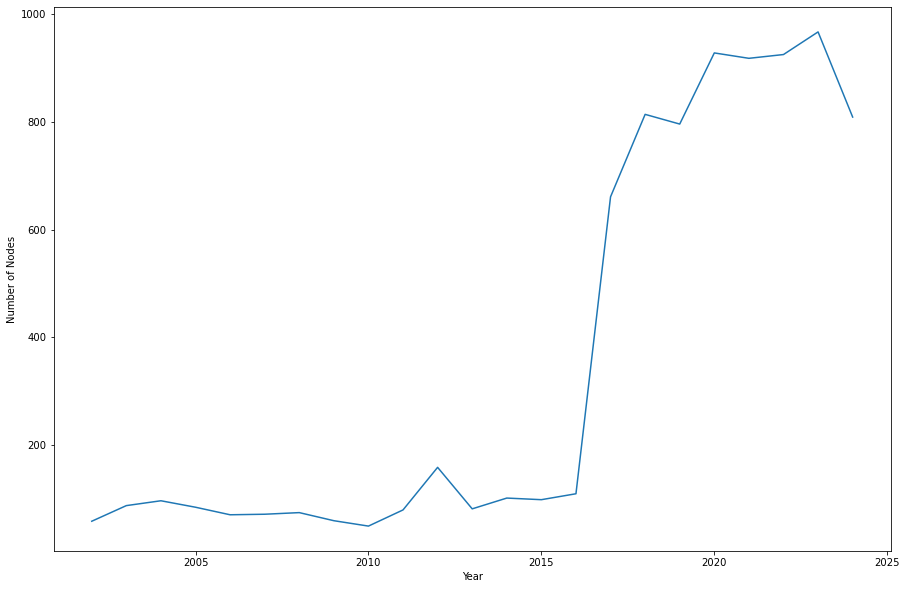

In [44]:
plt.figure(figsize=(15, 10))
plt.xlabel('Year')
plt.ylabel('Number of Nodes')
plt.plot(sorted(yearly_stats_dict.keys()), nodes_list)
plt.savefig(f'./Results/q2_node_trend.png')

## Number of edges (Collaborations)

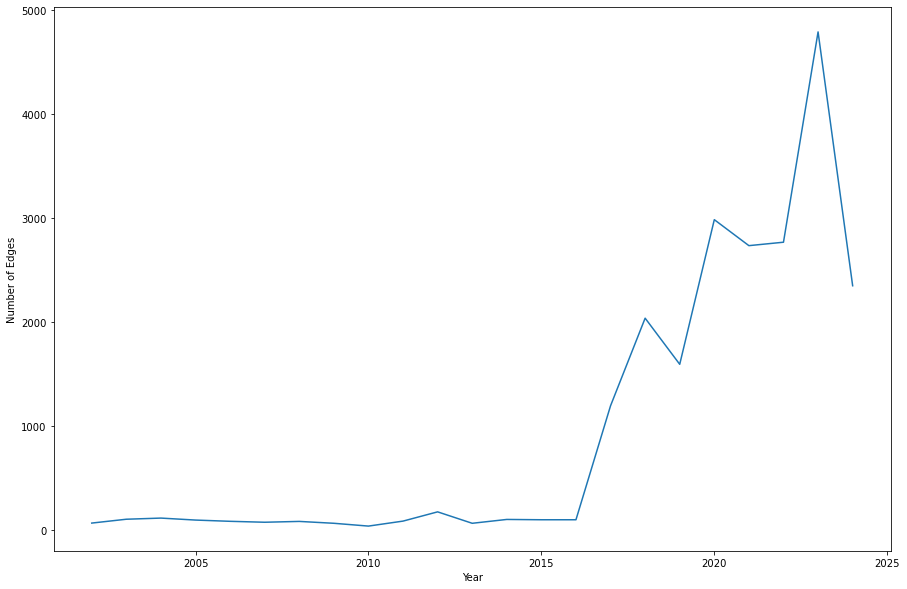

In [45]:
plt.figure(figsize=(15, 10))
plt.xlabel('Year')
plt.ylabel('Number of Edges')
plt.plot(sorted(yearly_stats_dict.keys()), edges_list)
plt.savefig(f'./Results/q2_edge_trend.png')

## Average node degree (average number of collaborations per researcher)

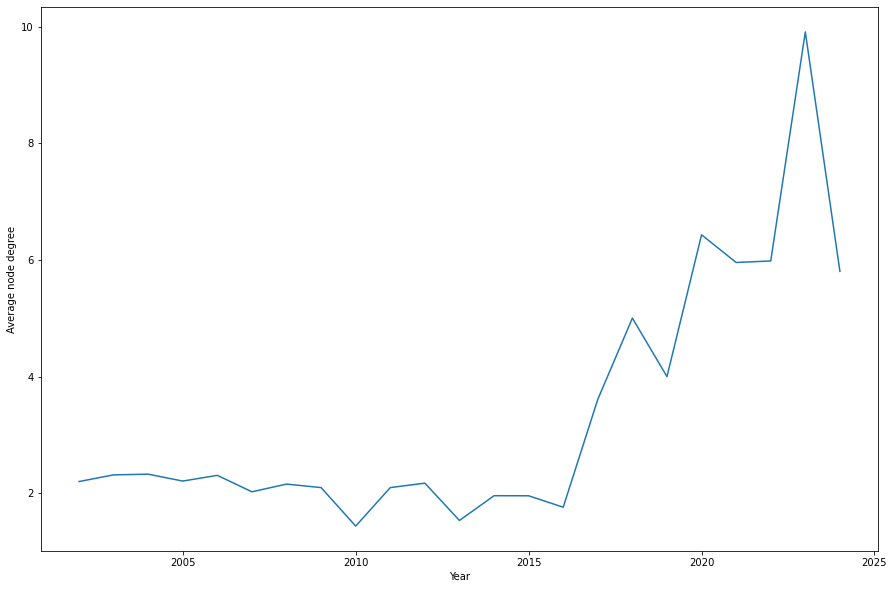

In [46]:
plt.figure(figsize=(15, 10))
plt.xlabel('Year')
plt.ylabel('Average node degree')
plt.plot(sorted(yearly_stats_dict.keys()), avg_node_degree)
plt.savefig(f'./Results/q2_node_degree_trend.png')

## Degree assortativity

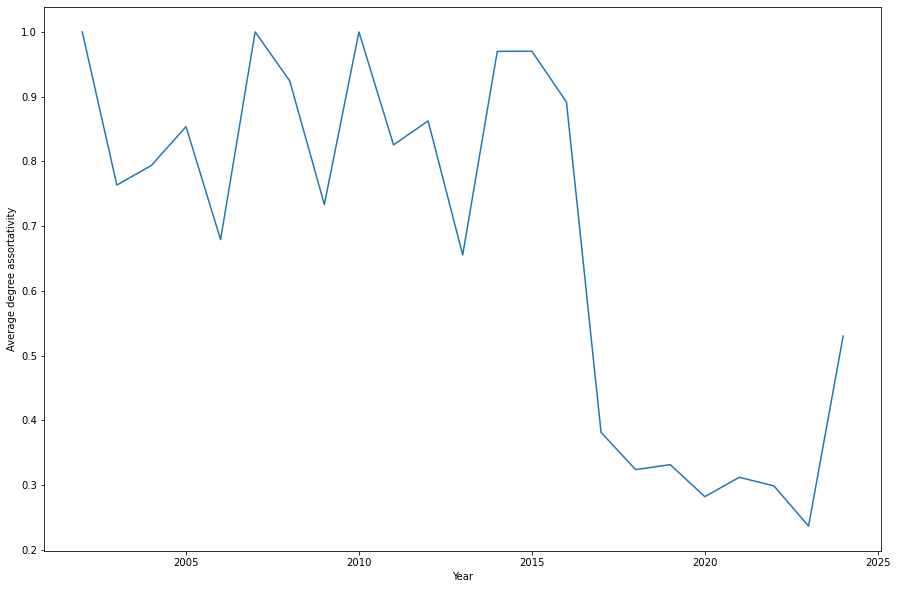

In [47]:
plt.figure(figsize=(15, 10))
plt.xlabel('Year')
plt.ylabel('Average degree assortativity')
plt.plot(sorted(yearly_stats_dict.keys()), degree_assortativity)
plt.savefig(f'./Results/q2_degree_assort_trend.png')

## Average clustering coefficient

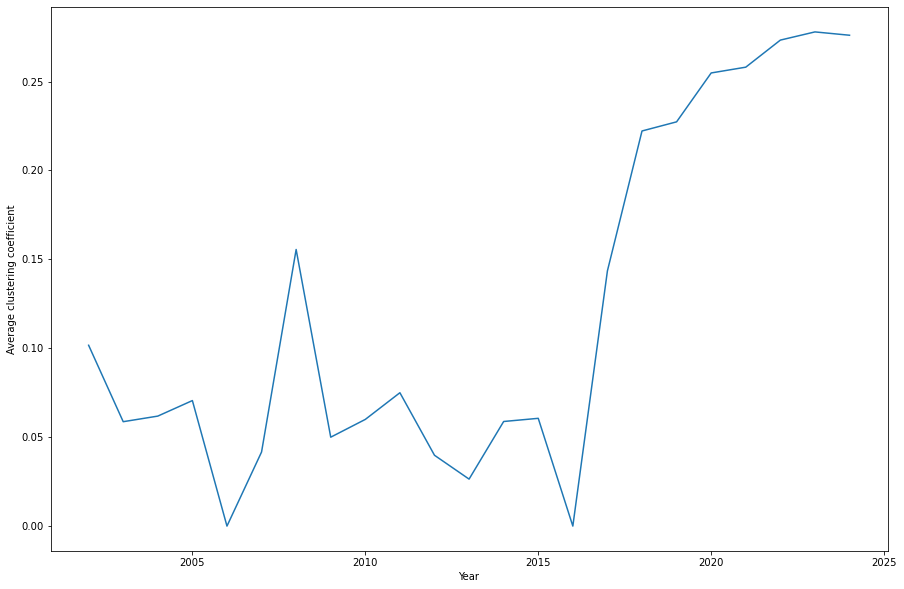

In [48]:
plt.figure(figsize=(15, 10))
plt.xlabel('Year')
plt.ylabel('Average clustering coefficient')
plt.plot(sorted(yearly_stats_dict.keys()), avg_cluster)
plt.savefig(f'./Results/q2_clustering_coeff_trend.png')

## Graph density

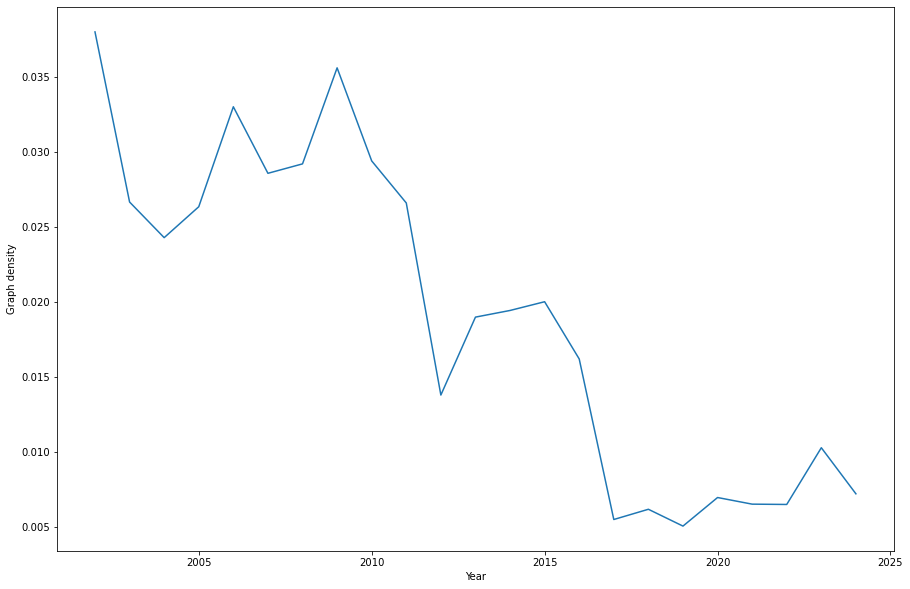

In [49]:
plt.figure(figsize=(15, 10))
plt.xlabel('Year')
plt.ylabel('Graph density')
plt.plot(sorted(yearly_stats_dict.keys()), density)
plt.savefig(f'./Results/q2_graph_density.png')

## Giant component size

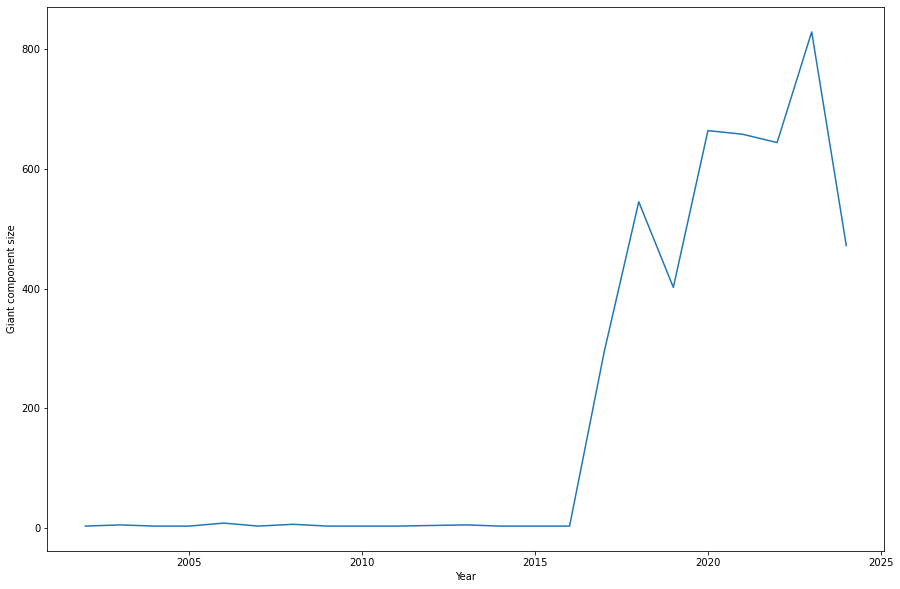

In [52]:
plt.figure(figsize=(15, 10))
plt.xlabel('Year')
plt.ylabel('Giant component size')
plt.plot(sorted(yearly_stats_dict.keys()), giant_comp)
plt.savefig(f'./Results/q2_giant_component_trend.png')

# Q4 code

In [ ]:
from tqdm.notebook import tqdm

# Function to get author year series
def get_author_year_series(root):
    if root is None:
        return None
  
    author = root.attrib['pid']
    year_coauthor_dict = dict()
  
    for i in range(len(root)):
        if root[i].tag == 'r':  # only look at article entries
            publish_work = root[i][0].attrib['key']
            publish_year = root[i][0].attrib['mdate'][:4]  # year
            current_year_coauthor_list = []
    
            for j in range(len(root[i][0])):
                if root[i][0][j].tag == 'author':
                    current_year_coauthor_list.append(root[i][0][j].attrib['pid'])
      
            if publish_year not in year_coauthor_dict:
                year_coauthor_dict[publish_year] = current_year_coauthor_list
            else:
                year_coauthor_dict[publish_year] += current_year_coauthor_list
  
    for year in year_coauthor_dict:
        year_coauthor_dict[year] = [year_coauthor_dict[year]]
    
    year_coauthor_series = pd.Series(year_coauthor_dict, name=author)
    return year_coauthor_series

# Function to get author root
def get_author_root(url):
    try:
        r = requests.get(url[:-4] + 'xml').text
        root = ET.fromstring(r)
    except:
        return None
    
    return root

scientists = pd.read_excel('DataScientists.xls')
scientists.drop_duplicates(subset='dblp', inplace=True, ignore_index=True)

# Step 1: Identify High-Degree Nodes
degree_threshold = 10  # Example threshold for high-degree nodes
high_degree_nodes = set()  # Set to store high-degree nodes

# Placeholder for author information for diversity checks
author_info = {
    'country': pd.Series(np.random.choice(['US', 'UK', 'China', 'India', 'Germany'], len(scientists))),
    'expertise': pd.Series(np.random.choice(['AI', 'ML', 'NLP', 'CV', 'Robotics'], len(scientists))),
    'institution': pd.Series(np.random.choice(['MIT', 'Stanford', 'CMU', 'Berkeley', 'Oxford'], len(scientists)))
}

collab_network_list = []
problem_list = []
join_series_list = []

for i in tqdm(range(len(scientists))):
    url = scientists.iloc[i]['dblp']
    root = get_author_root(url)
    
    if root is None:
        #problem_list.append([scientists.iloc[i]['pid'], url])
        #problem_list.append([root.attrib['pid'], url])
        problem_list.append([scientists.iloc[i]['dblp'], url])  # Use 'dblp' instead of 'pid'
        continue
  
    author_pid = root.attrib['pid']
    author_name = root.attrib['name']
    coauthors = set()
    
    for j in range(len(root)):
        if root[j].tag == 'r':  # only look at article entries
            for k in range(len(root[j][0])):
                if root[j][0][k].tag == 'author': 
                    coauthors.add(root[j][0][k].attrib['pid'])
    
    # Step 1: Identify High-Degree Nodes
    degree = len(coauthors)
    if degree > degree_threshold:
        high_degree_nodes.add(author_pid)
    
    # Step 2: Remove Nodes Connected to High-Degree Nodes
    filtered_coauthors = set()
    for coauthor in coauthors:
        if coauthor not in high_degree_nodes or not is_diverse_removal(author_pid, coauthor, collab_network_list):
            filtered_coauthors.add(coauthor)
    
    # Step 3: Ensure Network Properties (already partially achieved in Step 2)
    
    # Step 4: Enforce Collaboration Cutoff (kmax)
    kmax = 10  # Example collaboration cutoff
    if degree > kmax:
        filtered_coauthors = set(list(filtered_coauthors)[:kmax])  # Truncate coauthors list
  
    collab_network_list.append([author_name, author_pid, filtered_coauthors])

    join_series = get_author_year_series(root)
    join_series_list.append(join_series)

collab_network_csv = pd.DataFrame(collab_network_list, columns=['author_name', 'author_pid', 'coauthors_list'])
problem_list_csv = pd.DataFrame(problem_list, columns=['problem_pid', 'url'])

collab_network_csv.to_csv('./Transformed/q4_transformed_collab_network_csv.csv')

print("Transformed network generated!")